## Problem Statement
#### Background
Your client is a Media agency. It runs a TV Network in US. The primary source of their
revenue/audience comes from the Movies telecasted.

#### Data
The data corresponds to movies shown on a television network in the US. Two datasets have been
provided:-
1. Asset revenue data: this has the information on which asset/movie was shown at what time and
the revenue generated
2. ASSET_METADATA: Characteristics of the asset (Imdb ratings, tomato ratings, release date,
genre etc.)

Use the two datasets and after performing the appropriate transformations (joining, cleaning up,
feature engineering) to the data, create a model dataset to answer the following questions. Feel free to
include some other information, like list of public holidays:

#### Objective:
1. Exploratory Analysis: Give good data based justifications to the questions. If you have intuitions
about something try to justify that with data – that could be through a hypothesis test or even a
bar graph!
2. Prepare an set of charts and tables to highlight any trends or patterns you observe in the data.
3. Create a model with the data to estimate revenue that an asset will generate if telecasted at a
given time point (day-part and date).

* Will the revenue generated by an asset depend on external factors, like what time the movie was shown, or on factors internal to the asset or on both?
* Is there an interaction between when the movie was shown and asset characteristics,
like genre?
* Is there a linear dependence of revenue on the factors you found?
* Is there any seasonality effect in the data? Are there any holiday effects?
* Can you test if a movie of a specific genre can generate more revenue if it’s shown
during the Prime time (fringe) of a weekend against the primetime of any weekday?

## Importing the libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

## Reading the data

In [3]:
meta = pd.read_csv("ASSET_METADATA.csv")
scd_data = pd.read_csv("Schedule Data.csv")
meta.head()

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,...,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,BOX_OFFICE_EARNINGS
0,204750,2011.0,R,"Comedy, Thriller",6.2,46.0,"14,995",0,0,0,...,33.0,4.8,55.0,18.0,37.0,36.0,3.0,14994.0,rotten,"$94,700,000"
1,172902,2002.0,R,"Action, Sci-Fi, Sport",2.9,14.0,"21,493",0,0,2,...,3.0,2.6,117.0,4.0,113.0,14.0,2.1,36746.0,rotten,"$18,900,000"
2,198131,2007.0,PG-13,"Adventure, Comedy",2.3,17.0,"84,743",0,0,3,...,2.0,2.3,64.0,1.0,63.0,29.0,2.4,560170.0,rotten,"$39,700,000"
3,195393,2006.0,PG-13,"Comedy, Drama, Romance",6.8,62.0,254029,2,0,37,...,75.0,6.7,187.0,141.0,46.0,76.0,3.6,570016.0,certified,"$124,700,000"
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,...,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000"


In [4]:
scd_data.head()

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING
0,174543,9/13/2013 21:15,9/13/2013 23:45,0,1,0,150,Late Fringe,197840,595443.0
1,181758,9/24/2014 0:00,9/24/2014 3:00,0,0,1,180,Late Night,89818,216841.0
2,191074,9/12/2013 14:15,9/12/2013 16:15,0,1,0,120,Daytime,60064,388053.0
3,196156,7/14/2013 18:00,7/14/2013 21:00,1,1,0,180,Early Fringe,164494,670869.0
4,174201,11/14/2014 15:30,11/14/2014 17:30,0,0,1,120,Daytime,86961,311122.0


### Since our client is an Media agency and their primary source of revenue comes from movies telecasted thus our target variable will be "AIRING_REVENUE"

In [5]:
#Checking out the null values in Airing_Revenue
scd_data.AIRING_REVENUE.isnull().sum()

0

In [6]:
len(scd_data.ASSET_ID.unique())
#We have 412 unique ASSET_ID data to work upon

412

In [7]:
scd_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2517 entries, 0 to 2516
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ASSET_ID                2517 non-null   int64  
 1   AIRING_START_DATE_TIME  2517 non-null   object 
 2   AIRING_END_DATE_TIME    2517 non-null   object 
 3   PREMIER_AIRING          2517 non-null   int64  
 4   EXHIBITION_AIRING       2517 non-null   int64  
 5   FREE_AIRING             2517 non-null   int64  
 6   SCHEDULED_RUNTIME       2517 non-null   int64  
 7   DAY_PART                2517 non-null   object 
 8   AIRING_REVENUE          2517 non-null   int64  
 9   C3_RATING               2509 non-null   float64
dtypes: float64(1), int64(6), object(3)
memory usage: 196.8+ KB


In [8]:
#checking out all the null values in each columns
scd_data.isnull().sum()

ASSET_ID                  0
AIRING_START_DATE_TIME    0
AIRING_END_DATE_TIME      0
PREMIER_AIRING            0
EXHIBITION_AIRING         0
FREE_AIRING               0
SCHEDULED_RUNTIME         0
DAY_PART                  0
AIRING_REVENUE            0
C3_RATING                 8
dtype: int64

### Handling out the missing values of C3_RATING in Scheduled data

In [9]:
#8 rows where C3_RATING is null
scd_data[scd_data.C3_RATING.isnull()]

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING
133,195433,8/5/2014 14:45,8/5/2014 17:15,0,1,0,150,Daytime,99581,NaN
455,181163,10/13/2014 14:45,10/13/2014 17:30,0,1,0,165,Daytime,119725,NaN
487,181766,8/13/2014 14:45,8/13/2014 17:45,0,1,0,180,Daytime,99368,NaN
1523,185557,7/17/2013 0:45,7/17/2013 3:00,0,0,1,135,Late Night,25149,NaN
1781,174689,8/3/2014 17:45,8/3/2014 19:45,0,1,0,120,Early Fringe,137801,NaN
1930,171983,8/22/2014 17:45,8/22/2014 20:00,0,0,1,135,Early Fringe,166272,NaN
1982,185531,8/13/2014 17:45,8/13/2014 20:00,0,1,0,135,Early Fringe,164138,NaN
2230,172009,5/23/2014 0:45,5/23/2014 2:45,0,1,0,120,Late Night,38296,NaN


<AxesSubplot:xlabel='C3_RATING'>

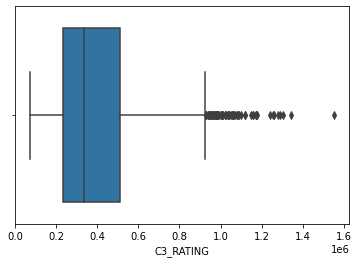

In [10]:
import warnings
warnings.filterwarnings('ignore')
sns.boxplot(scd_data.C3_RATING)

#### Observations
1. Since it is ```skewed``` we can not use mean to fill out the missing C3_Rating data.
2. We have numerous number of ```Outliers``` that we have to deal with.

<AxesSubplot:xlabel='C3_RATING', ylabel='Density'>

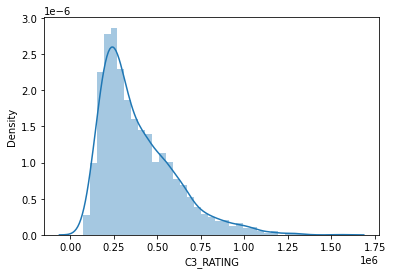

In [11]:
#Plotting the distribution plot
sns.distplot(scd_data.C3_RATING)

#### Observations
1. ```Right skewed``` (long tail in the right) thus we will either go for median or mode.
2. For the missing values we will choose the ```mode``` in this case

In [12]:
scd_data.C3_RATING.describe()

count    2.509000e+03
mean     3.905997e+05
std      2.127546e+05
min      7.152900e+04
25%      2.315390e+05
50%      3.329190e+05
75%      5.091160e+05
max      1.553844e+06
Name: C3_RATING, dtype: float64

In [13]:
#mode of the C3_RATING COLUMN
scd_data.C3_RATING.mode()[0]

170632.0

In [14]:
#filling out the missing values in C3_RATING Columns
scd_data["C3_RATING"] = scd_data["C3_RATING"].fillna(scd_data.C3_RATING.mode()[0])

In [15]:
scd_data.isnull().sum()

ASSET_ID                  0
AIRING_START_DATE_TIME    0
AIRING_END_DATE_TIME      0
PREMIER_AIRING            0
EXHIBITION_AIRING         0
FREE_AIRING               0
SCHEDULED_RUNTIME         0
DAY_PART                  0
AIRING_REVENUE            0
C3_RATING                 0
dtype: int64

In [16]:
#checking if C3_RATING filled by the mode.
scd_data[scd_data.ASSET_ID == 195433].head(1)

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING
133,195433,8/5/2014 14:45,8/5/2014 17:15,0,1,0,150,Daytime,99581,170632.0


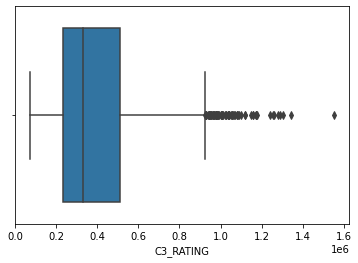

<AxesSubplot:xlabel='AIRING_REVENUE'>

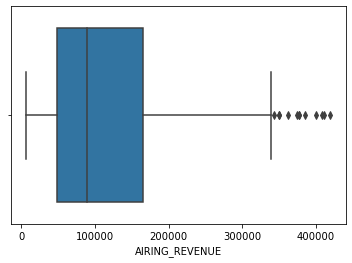

In [17]:
sns.boxplot(scd_data.C3_RATING)
plt.show()
sns.boxplot(scd_data.AIRING_REVENUE)

1. We need to handle the Outliers of C3 Rating and Airing Revenue

In [18]:
#Handling the outliers
c3_mean = scd_data.C3_RATING.mean()
c3_std = scd_data.C3_RATING.std()
c3_q1,c3_q3 = c3_mean - 3*c3_std , c3_mean + 3*c3_std

Air_mean = scd_data.AIRING_REVENUE.mean()
Air_std = scd_data.AIRING_REVENUE.std()
Air_q1,Air_q3 = Air_mean - 3*Air_std , Air_mean + 3*Air_std


In [19]:
scd_data.shape

(2517, 10)

In [20]:
#filtering out the data with no outliers
scd_new = scd_data[(scd_data.C3_RATING>c3_q1) & (scd_data.C3_RATING<c3_q3) &(scd_data.AIRING_REVENUE>Air_q1) &(scd_data.AIRING_REVENUE<Air_q3)]
scd_new

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING
0,174543,9/13/2013 21:15,9/13/2013 23:45,0,1,0,150,Late Fringe,197840,595443.0
1,181758,9/24/2014 0:00,9/24/2014 3:00,0,0,1,180,Late Night,89818,216841.0
2,191074,9/12/2013 14:15,9/12/2013 16:15,0,1,0,120,Daytime,60064,388053.0
3,196156,7/14/2013 18:00,7/14/2013 21:00,1,1,0,180,Early Fringe,164494,670869.0
4,174201,11/14/2014 15:30,11/14/2014 17:30,0,0,1,120,Daytime,86961,311122.0
...,...,...,...,...,...,...,...,...,...,...
2511,174543,6/27/2013 19:30,6/27/2013 22:00,0,1,0,150,Early Fringe,176643,640077.0
2512,185554,9/27/2014 1:30,9/27/2014 4:00,0,1,0,150,Late Night,23021,336985.0
2513,171859,1/29/2014 9:30,1/29/2014 12:00,0,1,0,150,Breakfast,50155,184164.0
2514,171986,8/18/2014 15:30,8/18/2014 18:00,0,1,0,150,Daytime,86038,461515.0


In [21]:
#converting to date_time format column
scd_new['AIRING_START_DATE_TIME'] = pd.to_datetime(scd_new.AIRING_START_DATE_TIME)
scd_new['AIRING_END_DATE_TIME'] = pd.to_datetime(scd_new.AIRING_END_DATE_TIME)
scd_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2472 entries, 0 to 2515
Data columns (total 10 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ASSET_ID                2472 non-null   int64         
 1   AIRING_START_DATE_TIME  2472 non-null   datetime64[ns]
 2   AIRING_END_DATE_TIME    2472 non-null   datetime64[ns]
 3   PREMIER_AIRING          2472 non-null   int64         
 4   EXHIBITION_AIRING       2472 non-null   int64         
 5   FREE_AIRING             2472 non-null   int64         
 6   SCHEDULED_RUNTIME       2472 non-null   int64         
 7   DAY_PART                2472 non-null   object        
 8   AIRING_REVENUE          2472 non-null   int64         
 9   C3_RATING               2472 non-null   float64       
dtypes: datetime64[ns](2), float64(1), int64(6), object(1)
memory usage: 212.4+ KB


In [22]:
#Extracting all the important data from date_time column
scd_new['AIRING_START_DATE'] = scd_new['AIRING_START_DATE_TIME'].dt.day
scd_new['AIRING_END_DATE'] = scd_new['AIRING_END_DATE_TIME'].dt.day
scd_new['AIRING_START_DAY'] = scd_new['AIRING_START_DATE_TIME'].dt.day_name()
scd_new['AIRING_END_DAY'] = scd_new['AIRING_END_DATE_TIME'].dt.day_name()
scd_new['AIRING_MONTH'] = scd_new['AIRING_START_DATE_TIME'].dt.month
scd_new['AIRING_YEAR'] = scd_new['AIRING_START_DATE_TIME'].dt.year
scd_new.head(3)

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR
0,174543,2013-09-13 21:15:00,2013-09-13 23:45:00,0,1,0,150,Late Fringe,197840,595443.0,13,13,Friday,Friday,9,2013
1,181758,2014-09-24 00:00:00,2014-09-24 03:00:00,0,0,1,180,Late Night,89818,216841.0,24,24,Wednesday,Wednesday,9,2014
2,191074,2013-09-12 14:15:00,2013-09-12 16:15:00,0,1,0,120,Daytime,60064,388053.0,12,12,Thursday,Thursday,9,2013


In [23]:
#checking out the where the start and end day are different
scd_new[scd_new['AIRING_START_DAY']!=scd_new['AIRING_END_DAY']]

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR
26,171996,2014-05-29 20:00:00,2014-05-30 00:01:00,0,1,0,241,Late Fringe,244557,520975.0,29,30,Thursday,Friday,5,2014
31,174243,2013-06-26 22:00:00,2013-06-27 00:15:00,0,1,0,135,Late Fringe,164420,991817.0,26,27,Wednesday,Thursday,6,2013
37,185324,2015-01-20 22:00:00,2015-01-21 00:30:00,0,1,0,150,Late Fringe,176324,491951.0,20,21,Tuesday,Wednesday,1,2015
49,185478,2014-06-23 23:00:00,2014-06-24 02:00:00,0,1,0,180,Late Night,198383,334098.0,23,24,Monday,Tuesday,6,2014
61,185358,2014-11-17 22:00:00,2014-11-18 00:00:00,0,0,1,120,Late Fringe,133758,443090.0,17,18,Monday,Tuesday,11,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2493,173738,2014-10-30 23:00:00,2014-10-31 01:00:00,0,0,1,120,Late Night,162642,502667.0,30,31,Thursday,Friday,10,2014
2498,185504,2014-01-24 22:00:00,2014-01-25 00:00:00,0,1,0,120,Late Fringe,167942,812303.0,24,25,Friday,Saturday,1,2014
2499,185234,2014-02-11 20:00:00,2014-02-12 00:01:00,0,1,0,241,Late Fringe,323265,500658.0,11,12,Tuesday,Wednesday,2,2014
2501,172392,2013-08-27 22:46:00,2013-08-28 01:32:00,0,0,1,166,Late Fringe,133287,529708.0,27,28,Tuesday,Wednesday,8,2013


In [24]:
#Creating the start and end time column
scd_new['AIRING_START_TIME']=scd_new['AIRING_START_DATE_TIME'].dt.time
scd_new['AIRING_END_TIME']=scd_new['AIRING_END_DATE_TIME'].dt.time
scd_new.head(3)

,ASSET_ID,AIRING_START_DATE_TIME,AIRING_END_DATE_TIME,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,174543,2013-09-13 21:15:00,2013-09-13 23:45:00,0,1,0,150,Late Fringe,197840,595443.0,13,13,Friday,Friday,9,2013,21:15:00,23:45:00
1,181758,2014-09-24 00:00:00,2014-09-24 03:00:00,0,0,1,180,Late Night,89818,216841.0,24,24,Wednesday,Wednesday,9,2014,00:00:00,03:00:00
2,191074,2013-09-12 14:15:00,2013-09-12 16:15:00,0,1,0,120,Daytime,60064,388053.0,12,12,Thursday,Thursday,9,2013,14:15:00,16:15:00


In [25]:
#dropping out the Airing_start and end_date_time column
scd_new.drop(columns=['AIRING_START_DATE_TIME','AIRING_END_DATE_TIME'],inplace = True)
scd_new.head(3)

,ASSET_ID,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,174543,0,1,0,150,Late Fringe,197840,595443.0,13,13,Friday,Friday,9,2013,21:15:00,23:45:00
1,181758,0,0,1,180,Late Night,89818,216841.0,24,24,Wednesday,Wednesday,9,2014,00:00:00,03:00:00
2,191074,0,1,0,120,Daytime,60064,388053.0,12,12,Thursday,Thursday,9,2013,14:15:00,16:15:00


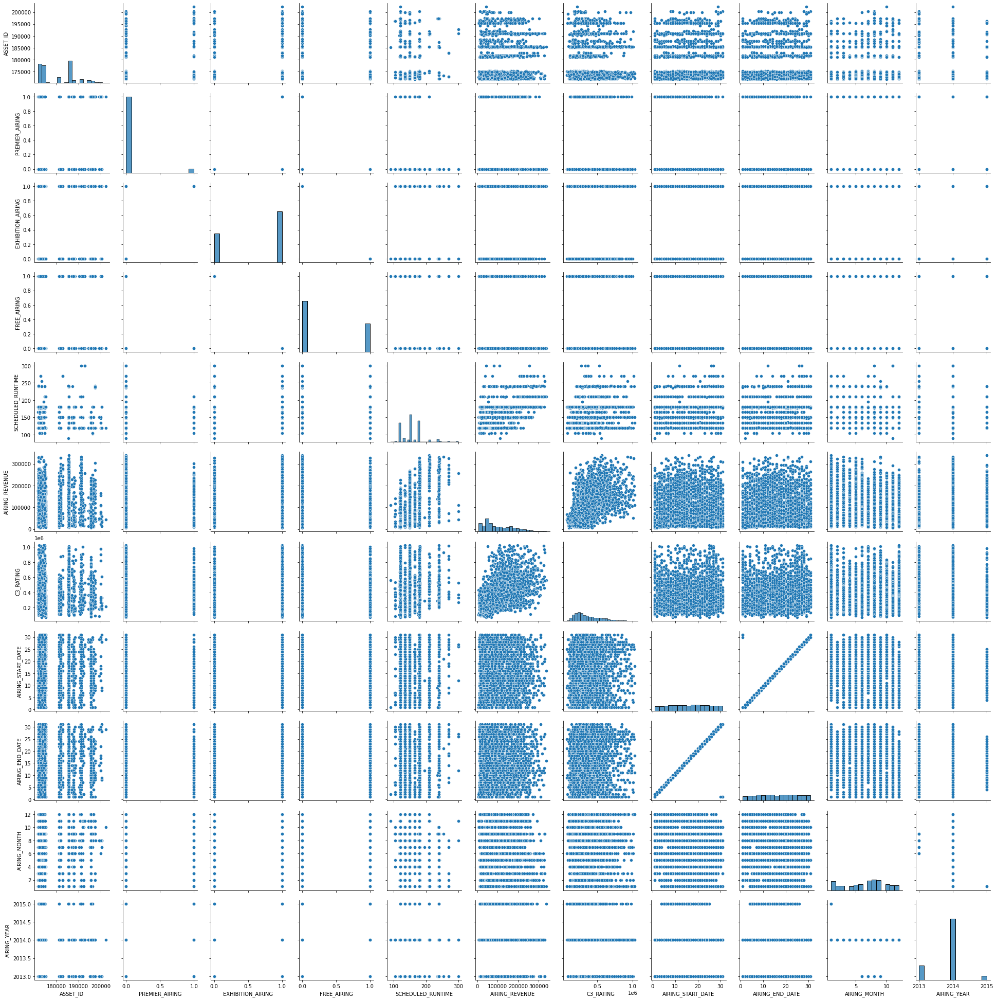

In [26]:
sns.pairplot(scd_new)

### Observation
1. There is some sort of correlation can be seen in C3_Rating and Airing Revenue.
2. The aboce can be confirmed by plotting a correlation heatmap as shown below.

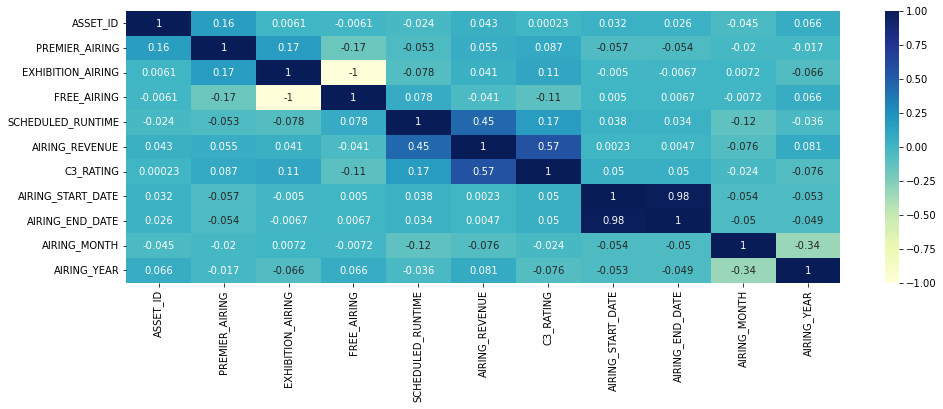

In [27]:
 # plotting correlation heatmap
plt.figure(figsize = (16,5))
sns.heatmap(scd_new.corr(), cmap="YlGnBu", annot=True)
  
# displaying heatmap
plt.show()

### Observation
1. A correlation of ```0.57``` is there between C3_Rating and Airing_Revenue
2. A correlation of ```0.45``` can be seen between Scheduled_Runtime and Airing_revenue
2. Thus more the C3_Rating, more will be the Airing_revenue

### Since the scheduled data is being cleaned and filtered, we can combine it with the meta data...

In [28]:
#merging the two data frames
joined_data = pd.merge(meta,scd_new,how="inner")

#display all the columns
pd.set_option('display.max_columns', None)
joined_data.head(20)

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,BOX_OFFICE_EARNINGS,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
5,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,"$30,100,000",0,1,0,120,Daytime,67558,246453.0,7,7,Friday,Friday,11,2014,16:30:00,18:30:00
6,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,"$256,300,000",0,1,0,120,Late Fringe,164907,429400.0,15,16,Saturday,Sunday,2,2014,22:00:00,00:00:00
7,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,"$256,300,000",0,1,0,121,Late Fringe,148627,840554.0,30,30,Thursday,Thursday,1,2014,20:00:00,22:01:00
8,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,"$256,300,000",0,1,0,120,Late Fringe,185327,559792.0,28,28,Friday,Friday,2,2014,21:00:00,23:00:00
9,196672,2003.0,R,"Action, Comedy, Crime",6.5,38.0,163415,0,0,12,5,23.0,4.1,176.0,40.0,136.0,78.0,3.6,500566.0,rotten,"$138,400,000",1,1,0,180,Early Fringe,127670,387526.0,24,24,Tuesday,Tuesday,9,2013,17:00:00,20:00:00


In [29]:
#checking out the null values
joined_data.isnull().sum()

ASSET_ID                  0
RELEASE_YEAR              0
MPAA_RATING              30
GENRE                     0
IMDB_RATING               0
IMDB_RANKING            557
IMDB_VOTES                0
Oscar-Nomination          0
Oscar-Wins                0
Other - Nominations       0
Other - Wins              0
TOMATO_METER            159
TOMATO_RATING           159
TOMATO_REVIEWS          159
TOMATO_FRESH            159
TOMATO_ROTTEN           159
TOMATO_USER_METER        79
TOMATO_USER_RATINGS      50
TOMATO_USER_REVIEWS      50
TOMATO_IMAGE            159
BOX_OFFICE_EARNINGS    1447
PREMIER_AIRING            0
EXHIBITION_AIRING         0
FREE_AIRING               0
SCHEDULED_RUNTIME         0
DAY_PART                  0
AIRING_REVENUE            0
C3_RATING                 0
AIRING_START_DATE         0
AIRING_END_DATE           0
AIRING_START_DAY          0
AIRING_END_DAY            0
AIRING_MONTH              0
AIRING_YEAR               0
AIRING_START_TIME         0
AIRING_END_TIME     

In [30]:
(joined_data.isnull().sum()/len(joined_data))*100

ASSET_ID                0.000000
RELEASE_YEAR            0.000000
MPAA_RATING             1.213592
GENRE                   0.000000
IMDB_RATING             0.000000
IMDB_RANKING           22.532362
IMDB_VOTES              0.000000
Oscar-Nomination        0.000000
Oscar-Wins              0.000000
Other - Nominations     0.000000
Other - Wins            0.000000
TOMATO_METER            6.432039
TOMATO_RATING           6.432039
TOMATO_REVIEWS          6.432039
TOMATO_FRESH            6.432039
TOMATO_ROTTEN           6.432039
TOMATO_USER_METER       3.195793
TOMATO_USER_RATINGS     2.022654
TOMATO_USER_REVIEWS     2.022654
TOMATO_IMAGE            6.432039
BOX_OFFICE_EARNINGS    58.535599
PREMIER_AIRING          0.000000
EXHIBITION_AIRING       0.000000
FREE_AIRING             0.000000
SCHEDULED_RUNTIME       0.000000
DAY_PART                0.000000
AIRING_REVENUE          0.000000
C3_RATING               0.000000
AIRING_START_DATE       0.000000
AIRING_END_DATE         0.000000
AIRING_STA

#### Observations
1. 58.53% of Box_office_Earnings data are missing throughout the desired data

In [31]:
# Dropping out the box office earning feature
joined_data.drop('BOX_OFFICE_EARNINGS',axis = 1,inplace=True)

In [32]:
#number of rows and columns in final dataframe
joined_data.shape

(2472, 35)

In [33]:
#sns.pairplot(joined_data)

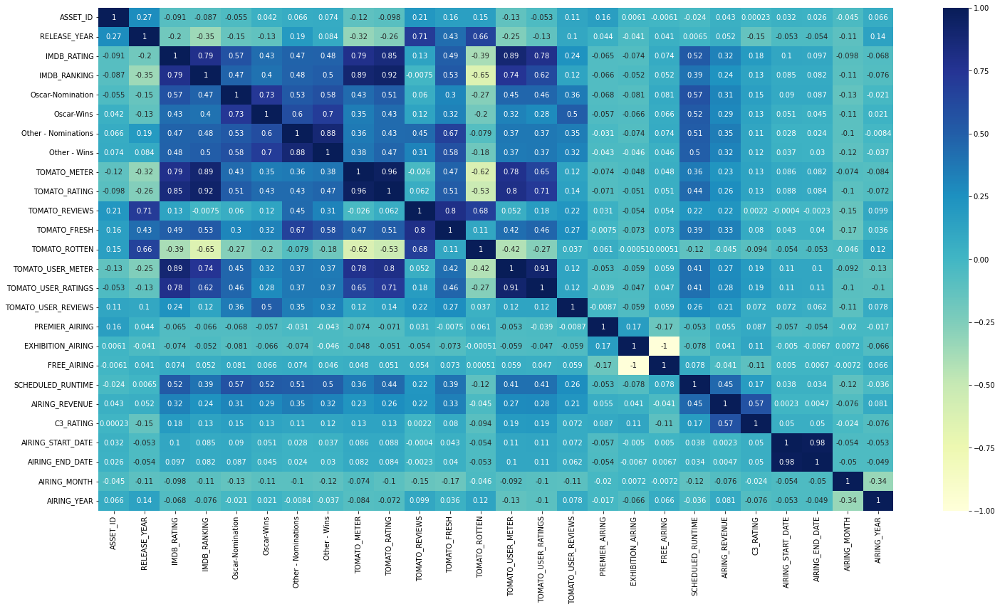

In [34]:
 # plotting correlation heatmap
plt.figure(figsize = (25,13))
sns.heatmap(joined_data.corr(), cmap="YlGnBu", annot=True)
  
# displaying heatmap
plt.show()

In [35]:
joined_data.head(10)

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
5,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,67558,246453.0,7,7,Friday,Friday,11,2014,16:30:00,18:30:00
6,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,0,1,0,120,Late Fringe,164907,429400.0,15,16,Saturday,Sunday,2,2014,22:00:00,00:00:00
7,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,0,1,0,121,Late Fringe,148627,840554.0,30,30,Thursday,Thursday,1,2014,20:00:00,22:01:00
8,191075,2007.0,PG-13,"Drama, Sci-Fi, Thriller",7.2,65.0,471316,0,0,21,9,70.0,6.4,207.0,145.0,62.0,68.0,3.6,1127270.0,fresh,0,1,0,120,Late Fringe,185327,559792.0,28,28,Friday,Friday,2,2014,21:00:00,23:00:00
9,196672,2003.0,R,"Action, Comedy, Crime",6.5,38.0,163415,0,0,12,5,23.0,4.1,176.0,40.0,136.0,78.0,3.6,500566.0,rotten,1,1,0,180,Early Fringe,127670,387526.0,24,24,Tuesday,Tuesday,9,2013,17:00:00,20:00:00


In [36]:
joined_data.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING           557
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER           159
TOMATO_RATING          159
TOMATO_REVIEWS         159
TOMATO_FRESH           159
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing IMBD_Ranking using Linear regression model

In [37]:
no_miss_rank = joined_data.loc[~joined_data['IMDB_RANKING'].isnull()]
miss_rank = joined_data.loc[joined_data['IMDB_RANKING'].isnull()]
no_miss_rank

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2467,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,1,0,135,Daytime,56336,411901.0,18,18,Monday,Monday,8,2014,13:15:00,15:30:00
2468,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,0,1,135,Late Night,18372,313192.0,19,19,Tuesday,Tuesday,8,2014,01:30:00,03:45:00
2469,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,0,1,135,Late Night,9159,295191.0,2,2,Thursday,Thursday,10,2014,02:30:00,04:45:00
2470,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,1,1,0,135,Late Fringe,198795,668838.0,14,14,Thursday,Thursday,8,2014,20:00:00,22:15:00


<AxesSubplot:xlabel='IMDB_RATING', ylabel='IMDB_RANKING'>

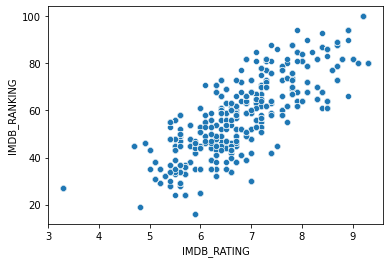

In [38]:
sns.scatterplot('IMDB_RATING','IMDB_RANKING', data = joined_data)

<AxesSubplot:xlabel='IMDB_RATING', ylabel='IMDB_RANKING'>

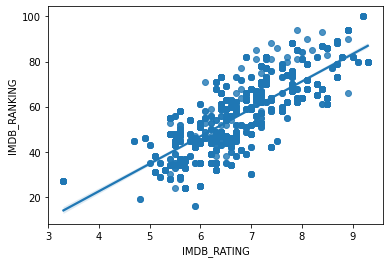

In [39]:
sns.regplot('IMDB_RATING','IMDB_RANKING',data = joined_data)

In [40]:
df_rank_train = no_miss_rank[['ASSET_ID','IMDB_RATING','IMDB_RANKING']]
df_rank_pred = miss_rank[['ASSET_ID','IMDB_RATING','IMDB_RANKING']]
df_rank_train

,ASSET_ID,IMDB_RATING,IMDB_RANKING
0,185444,5.4,28.0
1,185444,5.4,28.0
2,185444,5.4,28.0
3,185444,5.4,28.0
4,185444,5.4,28.0
...,...,...,...
2467,185566,6.9,51.0
2468,185566,6.9,51.0
2469,185566,6.9,51.0
2470,185566,6.9,51.0


In [41]:
#Specifying the x and y values
x=df_rank_train.iloc[:,1].values.reshape(-1,1)
y=df_rank_train.iloc[:,-1].values

In [42]:
#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

LinearRegression()

In [43]:
r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

The value of R2 (coeff of determination) is:  0.6167176293059873


In [44]:
#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


intercept or b1: -25.99149887524041
slope or b2: [12.14537103]


In [45]:
#predicting the missing values
x_new=df_rank_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([48.09526438, 48.09526438, 48.09526438, 31.09174495, 31.09174495,
       72.38600643, 45.66619018, 45.66619018, 45.66619018, 45.66619018,
       45.66619018, 45.66619018, 45.66619018, 45.66619018, 45.66619018,
       45.66619018, 55.382487  , 55.382487  , 55.382487  , 55.382487  ,
       55.382487  , 55.382487  , 55.382487  , 55.382487  , 55.382487  ,
       55.382487  , 55.382487  , 55.382487  , 55.382487  , 55.382487  ,
       55.382487  , 45.66619018, 45.66619018, 45.66619018, 60.24063541,
       60.24063541, 60.24063541, 35.94989336, 35.94989336, 29.87720784,
       38.37896756, 38.37896756, 38.37896756, 38.37896756, 38.37896756,
       60.24063541, 52.95341279, 52.95341279, 39.59350466, 39.59350466,
       67.52785802, 67.52785802, 37.16443046, 37.16443046, 57.8115612 ,
       57.8115612 , 57.8115612 , 57.8115612 , 57.8115612 , 57.8115612 ,
       46.88072728, 46.88072728, 46.88072728, 46.88072728, 46.88072728,
       46.88072728, 46.88072728, 46.88072728, 46.88072728, 46.88

In [46]:
miss_rank['IMDB_RANKING']=y_pred.round()
miss_rank

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
57,174839,1992.0,R,"Action, Drama, Music",6.1,48.0,"81,389",2,0,18,10,32.0,4.8,34.0,11.0,23.0,64.0,3.0,260107.0,rotten,0,1,0,180,Late Night,48098,330302.0,19,19,Wednesday,Wednesday,2,2014,00:30:00,03:30:00
58,174839,1992.0,R,"Action, Drama, Music",6.1,48.0,"81,389",2,0,18,10,32.0,4.8,34.0,11.0,23.0,64.0,3.0,260107.0,rotten,0,1,0,180,Daytime,60409,139725.0,9,9,Wednesday,Wednesday,4,2014,11:30:00,14:30:00
59,174839,1992.0,R,"Action, Drama, Music",6.1,48.0,"81,389",2,0,18,10,32.0,4.8,34.0,11.0,23.0,64.0,3.0,260107.0,rotten,0,0,1,180,Daytime,70533,222616.0,19,19,Wednesday,Wednesday,2,2014,12:30:00,15:30:00
60,185498,1993.0,PG,"Comedy, Family, Romance",4.7,31.0,"17,288",1,0,4,0,27.0,4.6,11.0,3.0,8.0,30.0,2.6,68567.0,rotten,0,0,1,120,Late Night,21906,132370.0,8,8,Thursday,Thursday,5,2014,02:00:00,04:00:00
61,185498,1993.0,PG,"Comedy, Family, Romance",4.7,31.0,"17,288",1,0,4,0,27.0,4.6,11.0,3.0,8.0,30.0,2.6,68567.0,rotten,1,1,0,120,Late Fringe,191426,315689.0,7,8,Wednesday,Thursday,5,2014,22:00:00,00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [47]:
no_miss_rank

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2467,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,1,0,135,Daytime,56336,411901.0,18,18,Monday,Monday,8,2014,13:15:00,15:30:00
2468,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,0,1,135,Late Night,18372,313192.0,19,19,Tuesday,Tuesday,8,2014,01:30:00,03:45:00
2469,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,0,0,1,135,Late Night,9159,295191.0,2,2,Thursday,Thursday,10,2014,02:30:00,04:45:00
2470,185566,1989.0,PG,"Comedy, Drama, Family",6.9,51.0,"57,266",0,0,0,0,64.0,5.9,22.0,14.0,8.0,77.0,3.2,199330.0,fresh,1,1,0,135,Late Fringe,198795,668838.0,14,14,Thursday,Thursday,8,2014,20:00:00,22:15:00


In [48]:
no_miss_IMDB_RANKING  = pd.concat([no_miss_rank,miss_rank])
no_miss_IMDB_RANKING

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [49]:
no_miss_IMDB_RANKING.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER           159
TOMATO_RATING          159
TOMATO_REVIEWS         159
TOMATO_FRESH           159
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_METER  using Linear regression model

In [50]:
no_miss_meter = no_miss_IMDB_RANKING.loc[~no_miss_IMDB_RANKING['TOMATO_METER'].isnull()]
miss_meter = no_miss_IMDB_RANKING.loc[no_miss_IMDB_RANKING['TOMATO_METER'].isnull()]
no_miss_meter

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2452,172872,1986.0,PG,"Action, Family, Romance",5.8,44.0,"45,769",1,0,2,4,43.0,4.9,23.0,10.0,13.0,52.0,3.0,121448.0,rotten,0,1,0,149,Late Night,116240,460578.0,30,31,Wednesday,Thursday,7,2014,23:01:00,01:30:00
2453,172872,1986.0,PG,"Action, Family, Romance",5.8,44.0,"45,769",1,0,2,4,43.0,4.9,23.0,10.0,13.0,52.0,3.0,121448.0,rotten,0,1,0,150,Daytime,80691,195342.0,15,15,Friday,Friday,8,2014,14:30:00,17:00:00
2454,172872,1986.0,PG,"Action, Family, Romance",5.8,44.0,"45,769",1,0,2,4,43.0,4.9,23.0,10.0,13.0,52.0,3.0,121448.0,rotten,0,0,1,150,Late Night,28001,295591.0,25,25,Friday,Friday,7,2014,01:30:00,04:00:00
2455,172872,1986.0,PG,"Action, Family, Romance",5.8,44.0,"45,769",1,0,2,4,43.0,4.9,23.0,10.0,13.0,52.0,3.0,121448.0,rotten,0,1,0,150,Daytime,123349,497136.0,3,3,Sunday,Sunday,8,2014,15:15:00,17:45:00


<AxesSubplot:xlabel='IMDB_RATING', ylabel='TOMATO_METER'>

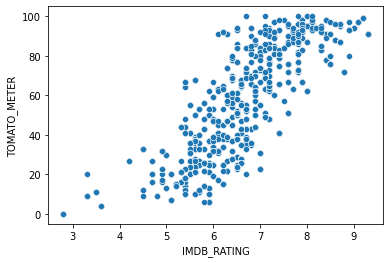

In [51]:
sns.scatterplot('IMDB_RATING','TOMATO_METER', data = no_miss_IMDB_RANKING)

<AxesSubplot:xlabel='IMDB_RATING', ylabel='TOMATO_METER'>

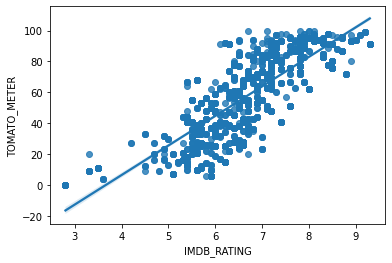

In [52]:
sns.regplot('IMDB_RATING','TOMATO_METER',data = no_miss_IMDB_RANKING)

In [53]:
df_meter_train = no_miss_meter[['ASSET_ID','IMDB_RATING','TOMATO_METER']]
df_meter_pred = miss_meter[['ASSET_ID','IMDB_RATING','TOMATO_METER']]
df_meter_train

,ASSET_ID,IMDB_RATING,TOMATO_METER
0,185444,5.4,14.0
1,185444,5.4,14.0
2,185444,5.4,14.0
3,185444,5.4,14.0
4,185444,5.4,14.0
...,...,...,...
2452,172872,5.8,43.0
2453,172872,5.8,43.0
2454,172872,5.8,43.0
2455,172872,5.8,43.0


In [54]:
#Specifying the x and y values
x=df_meter_train.iloc[:,1].values.reshape(-1,1)
y=df_meter_train.iloc[:,-1].values

In [55]:
#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

LinearRegression()

In [56]:
r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

The value of R2 (coeff of determination) is:  0.6200592049733713


In [57]:
#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


intercept or b1: -70.08564425675732
slope or b2: [19.13193673]


In [58]:
#predicting the missing values
x_new=df_meter_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([ 27.48723309,  27.48723309,  27.48723309,  27.48723309,
        27.48723309,  27.48723309,  27.48723309,  27.48723309,
        73.40388125,  73.40388125,  73.40388125,  50.44555717,
        50.44555717,  50.44555717,  50.44555717,  50.44555717,
        50.44555717,  50.44555717,  50.44555717,  50.44555717,
        50.44555717,  50.44555717,  50.44555717,  50.44555717,
        50.44555717,  50.44555717,  50.44555717,  44.70597615,
        44.70597615,  44.70597615,  44.70597615,  44.70597615,
        44.70597615,  44.70597615,  44.70597615,  44.70597615,
        44.70597615,  44.70597615,  44.70597615,  44.70597615,
        44.70597615,  44.70597615,  44.70597615,  44.70597615,
        44.70597615,  44.70597615,  44.70597615,  44.70597615,
        44.70597615,  79.14346227,  79.14346227,  79.14346227,
        79.14346227,  79.14346227,  79.14346227,  79.14346227,
        79.14346227,  79.14346227,  79.14346227,  79.14346227,
        79.14346227,  79.14346227,  79.14346227,  79.14

In [59]:
miss_meter['TOMATO_METER']=y_pred.round()
miss_meter

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,NaN,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,NaN,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,NaN,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,NaN,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,NaN,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [60]:
no_miss_TOMATO_METER  = pd.concat([no_miss_meter,miss_meter])
no_miss_TOMATO_METER

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [61]:
no_miss_TOMATO_METER.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING          159
TOMATO_REVIEWS         159
TOMATO_FRESH           159
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_RATING using Linear regression model

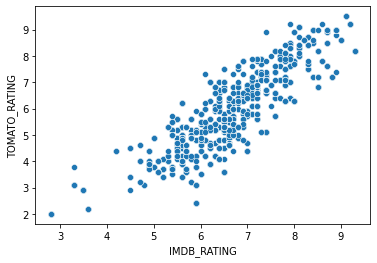

<AxesSubplot:xlabel='IMDB_RATING', ylabel='TOMATO_RATING'>

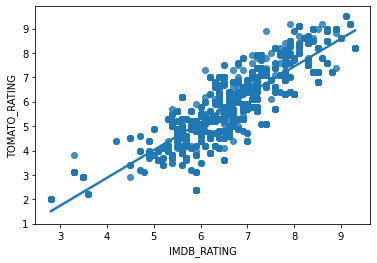

In [62]:
no_miss_rating = no_miss_TOMATO_METER.loc[~no_miss_TOMATO_METER['TOMATO_RATING'].isnull()]
miss_rating = no_miss_TOMATO_METER.loc[no_miss_TOMATO_METER['TOMATO_RATING'].isnull()]

sns.scatterplot('IMDB_RATING','TOMATO_RATING', data = no_miss_TOMATO_METER)
plt.show()
sns.regplot('IMDB_RATING','TOMATO_RATING',data = no_miss_TOMATO_METER)

In [63]:
df_rating_train = no_miss_rating[['ASSET_ID','IMDB_RATING','TOMATO_RATING']]
df_rating_pred = miss_rating[['ASSET_ID','IMDB_RATING','TOMATO_RATING']]
df_rating_train

,ASSET_ID,IMDB_RATING,TOMATO_RATING
0,185444,5.4,3.8
1,185444,5.4,3.8
2,185444,5.4,3.8
3,185444,5.4,3.8
4,185444,5.4,3.8
...,...,...,...
2452,172872,5.8,4.9
2453,172872,5.8,4.9
2454,172872,5.8,4.9
2455,172872,5.8,4.9


In [64]:
#Specifying the x and y values
x=df_rating_train.iloc[:,1].values.reshape(-1,1)
y=df_rating_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


The value of R2 (coeff of determination) is:  0.7188627285231786
intercept or b1: -1.6855281841330765
slope or b2: [1.1409314]


In [65]:
#predicting the missing values
x_new=df_rating_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([4.13322197, 4.13322197, 4.13322197, 4.13322197, 4.13322197,
       4.13322197, 4.13322197, 4.13322197, 6.87145733, 6.87145733,
       6.87145733, 5.50233965, 5.50233965, 5.50233965, 5.50233965,
       5.50233965, 5.50233965, 5.50233965, 5.50233965, 5.50233965,
       5.50233965, 5.50233965, 5.50233965, 5.50233965, 5.50233965,
       5.50233965, 5.50233965, 5.16006023, 5.16006023, 5.16006023,
       5.16006023, 5.16006023, 5.16006023, 5.16006023, 5.16006023,
       5.16006023, 5.16006023, 5.16006023, 5.16006023, 5.16006023,
       5.16006023, 5.16006023, 5.16006023, 5.16006023, 5.16006023,
       5.16006023, 5.16006023, 5.16006023, 5.16006023, 7.21373675,
       7.21373675, 7.21373675, 7.21373675, 7.21373675, 7.21373675,
       7.21373675, 7.21373675, 7.21373675, 7.21373675, 7.21373675,
       7.21373675, 7.21373675, 7.21373675, 7.21373675, 7.21373675,
       7.21373675, 7.21373675, 7.21373675, 7.21373675, 7.21373675,
       5.38824651, 4.58959453, 4.58959453, 4.58959453, 4.58959

In [66]:
miss_rating['TOMATO_RATING']=y_pred.round(1)
miss_rating

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,NaN,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [67]:
no_miss_TOMATO_RATING  = pd.concat([no_miss_rating,miss_rating])
no_miss_TOMATO_RATING

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [68]:
no_miss_TOMATO_RATING.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS         159
TOMATO_FRESH           159
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_FRESH using Linear regression model

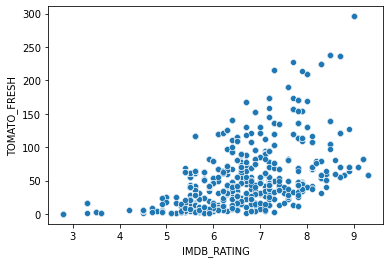

<AxesSubplot:xlabel='IMDB_RATING', ylabel='TOMATO_FRESH'>

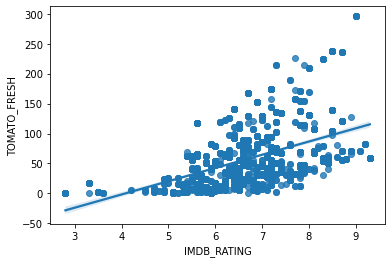

In [69]:
no_miss_fresh = no_miss_TOMATO_RATING.loc[~no_miss_TOMATO_RATING['TOMATO_FRESH'].isnull()]
miss_fresh = no_miss_TOMATO_RATING.loc[no_miss_TOMATO_RATING['TOMATO_FRESH'].isnull()]

sns.scatterplot('IMDB_RATING','TOMATO_FRESH', data = no_miss_TOMATO_RATING)
plt.show()
sns.regplot('IMDB_RATING','TOMATO_FRESH',data = no_miss_TOMATO_RATING)

In [70]:
df_fresh_train = no_miss_fresh[['ASSET_ID','IMDB_RATING','TOMATO_FRESH']]
df_fresh_pred = miss_fresh[['ASSET_ID','IMDB_RATING','TOMATO_FRESH']]
df_fresh_train

,ASSET_ID,IMDB_RATING,TOMATO_FRESH
0,185444,5.4,17.0
1,185444,5.4,17.0
2,185444,5.4,17.0
3,185444,5.4,17.0
4,185444,5.4,17.0
...,...,...,...
2452,172872,5.8,10.0
2453,172872,5.8,10.0
2454,172872,5.8,10.0
2455,172872,5.8,10.0


In [71]:
#Specifying the x and y values
x=df_fresh_train.iloc[:,1].values.reshape(-1,1)
y=df_fresh_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


The value of R2 (coeff of determination) is:  0.24400692761303955
intercept or b1: -90.38425308300462
slope or b2: [22.12310984]


In [72]:
#predicting the missing values
x_new=df_fresh_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([ 22.44360708,  22.44360708,  22.44360708,  22.44360708,
        22.44360708,  22.44360708,  22.44360708,  22.44360708,
        75.53907069,  75.53907069,  75.53907069,  48.99133888,
        48.99133888,  48.99133888,  48.99133888,  48.99133888,
        48.99133888,  48.99133888,  48.99133888,  48.99133888,
        48.99133888,  48.99133888,  48.99133888,  48.99133888,
        48.99133888,  48.99133888,  48.99133888,  42.35440593,
        42.35440593,  42.35440593,  42.35440593,  42.35440593,
        42.35440593,  42.35440593,  42.35440593,  42.35440593,
        42.35440593,  42.35440593,  42.35440593,  42.35440593,
        42.35440593,  42.35440593,  42.35440593,  42.35440593,
        42.35440593,  42.35440593,  42.35440593,  42.35440593,
        42.35440593,  82.17600364,  82.17600364,  82.17600364,
        82.17600364,  82.17600364,  82.17600364,  82.17600364,
        82.17600364,  82.17600364,  82.17600364,  82.17600364,
        82.17600364,  82.17600364,  82.17600364,  82.17

In [73]:
miss_fresh['TOMATO_FRESH']=y_pred.round(0)
miss_fresh

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,22.0,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,22.0,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,NaN,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [74]:
no_miss_TOMATO_FRESH  = pd.concat([no_miss_fresh,miss_fresh])
no_miss_TOMATO_FRESH

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,NaN,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [75]:
no_miss_TOMATO_FRESH.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS         159
TOMATO_FRESH             0
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_REVIEWS using Linear regression model

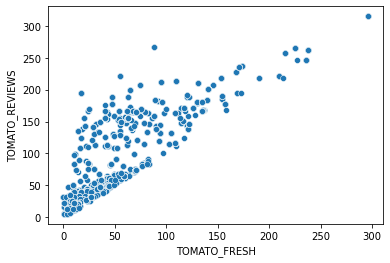

<AxesSubplot:xlabel='TOMATO_FRESH', ylabel='TOMATO_REVIEWS'>

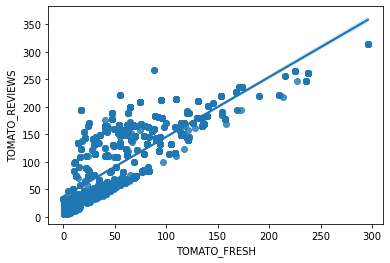

In [76]:
no_miss_review = no_miss_TOMATO_FRESH.loc[~no_miss_TOMATO_RATING['TOMATO_REVIEWS'].isnull()]
miss_review = no_miss_TOMATO_FRESH.loc[no_miss_TOMATO_RATING['TOMATO_REVIEWS'].isnull()]

sns.scatterplot('TOMATO_FRESH','TOMATO_REVIEWS', data = no_miss_TOMATO_RATING)
plt.show()
sns.regplot('TOMATO_FRESH','TOMATO_REVIEWS',data = no_miss_TOMATO_RATING)

In [77]:
df_review_train = no_miss_review[['ASSET_ID','TOMATO_FRESH','TOMATO_REVIEWS']]
df_review_pred = miss_review[['ASSET_ID','TOMATO_FRESH','TOMATO_REVIEWS']]
df_review_train

,ASSET_ID,TOMATO_FRESH,TOMATO_REVIEWS
0,185444,17.0,124.0
1,185444,17.0,124.0
2,185444,17.0,124.0
3,185444,17.0,124.0
4,185444,17.0,124.0
...,...,...,...
2452,172872,10.0,23.0
2453,172872,10.0,23.0
2454,172872,10.0,23.0
2455,172872,10.0,23.0


In [78]:
#Specifying the x and y values
x=df_review_train.iloc[:,1].values.reshape(-1,1)
y=df_review_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


The value of R2 (coeff of determination) is:  0.6422700295949103
intercept or b1: 36.8249317313959
slope or b2: [1.08658859]


In [79]:
#predicting the missing values
x_new=df_review_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([ 60.7298808 ,  60.7298808 ,  60.7298808 ,  60.7298808 ,
        60.7298808 ,  60.7298808 ,  60.7298808 ,  60.7298808 ,
       119.40566489, 119.40566489, 119.40566489,  90.06777285,
        90.06777285,  90.06777285,  90.06777285,  90.06777285,
        90.06777285,  90.06777285,  90.06777285,  90.06777285,
        90.06777285,  90.06777285,  90.06777285,  90.06777285,
        90.06777285,  90.06777285,  90.06777285,  82.46165269,
        82.46165269,  82.46165269,  82.46165269,  82.46165269,
        82.46165269,  82.46165269,  82.46165269,  82.46165269,
        82.46165269,  82.46165269,  82.46165269,  82.46165269,
        82.46165269,  82.46165269,  82.46165269,  82.46165269,
        82.46165269,  82.46165269,  82.46165269,  82.46165269,
        82.46165269, 125.92519646, 125.92519646, 125.92519646,
       125.92519646, 125.92519646, 125.92519646, 125.92519646,
       125.92519646, 125.92519646, 125.92519646, 125.92519646,
       125.92519646, 125.92519646, 125.92519646, 125.92

In [80]:
miss_review['TOMATO_REVIEWS']=y_pred.round()
miss_review

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,NaN,NaN,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,NaN,NaN,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [81]:
no_miss_TOMATO_REVIEWS  = pd.concat([no_miss_review,miss_review])
no_miss_TOMATO_REVIEWS

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,NaN,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [82]:
no_miss_TOMATO_REVIEWS.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS           0
TOMATO_FRESH             0
TOMATO_ROTTEN          159
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

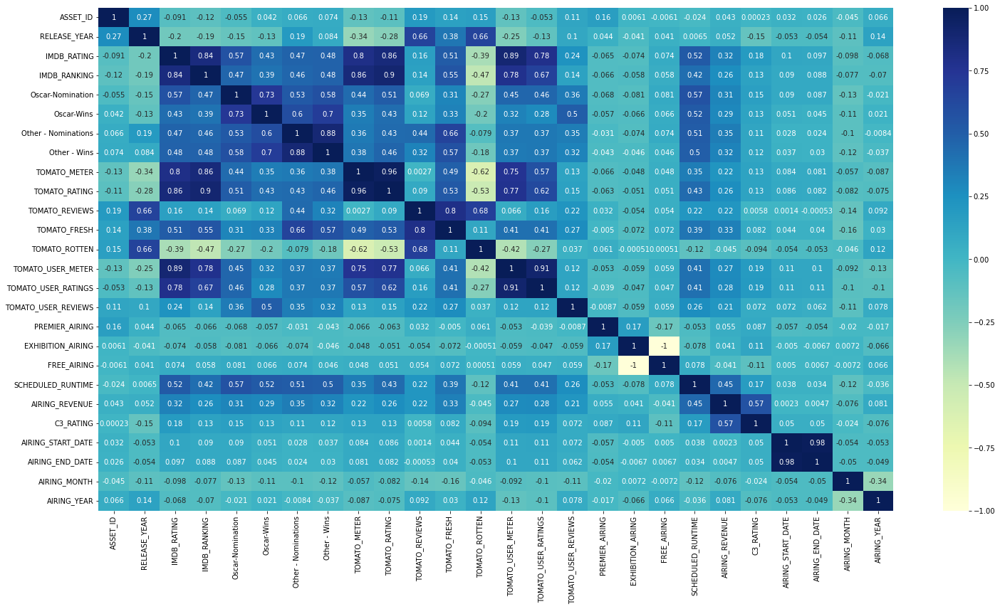

In [83]:
# plotting correlation heatmap
plt.figure(figsize = (25,13))
sns.heatmap(no_miss_TOMATO_REVIEWS.corr(),cmap="YlGnBu",annot=True)
  
# displaying heatmap
plt.show()

### Dealing with the missing TOMATO_ROTTEN using Linear regression model

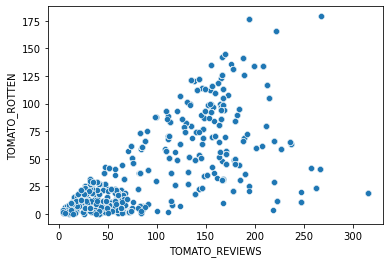

<AxesSubplot:xlabel='TOMATO_REVIEWS', ylabel='TOMATO_ROTTEN'>

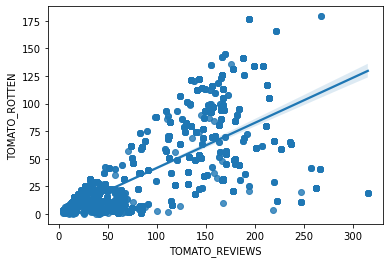

In [84]:
no_miss_rotten = no_miss_TOMATO_REVIEWS.loc[~no_miss_TOMATO_REVIEWS['TOMATO_ROTTEN'].isnull()]
miss_rotten = no_miss_TOMATO_REVIEWS.loc[no_miss_TOMATO_REVIEWS['TOMATO_ROTTEN'].isnull()]

sns.scatterplot('TOMATO_REVIEWS','TOMATO_ROTTEN', data = no_miss_TOMATO_REVIEWS)
plt.show()
sns.regplot('TOMATO_REVIEWS','TOMATO_ROTTEN',data = no_miss_TOMATO_REVIEWS)

In [85]:
df_rotten_train = no_miss_rotten[['ASSET_ID','TOMATO_REVIEWS','TOMATO_ROTTEN']]
df_rotten_pred = miss_rotten[['ASSET_ID','TOMATO_REVIEWS','TOMATO_ROTTEN']]
df_rotten_train

,ASSET_ID,TOMATO_REVIEWS,TOMATO_ROTTEN
0,185444,124.0,107.0
1,185444,124.0,107.0
2,185444,124.0,107.0
3,185444,124.0,107.0
4,185444,124.0,107.0
...,...,...,...
2452,172872,23.0,13.0
2453,172872,23.0,13.0
2454,172872,23.0,13.0
2455,172872,23.0,13.0


In [86]:
#Specifying the x and y values
x=df_rotten_train.iloc[:,1].values.reshape(-1,1)
y=df_rotten_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


The value of R2 (coeff of determination) is:  0.4621466522729556
intercept or b1: 0.7938884318423121
slope or b2: [0.40891149]


In [87]:
#predicting the missing values
x_new=df_rotten_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([25.73748952, 25.73748952, 25.73748952, 25.73748952, 25.73748952,
       25.73748952, 25.73748952, 25.73748952, 49.45435613, 49.45435613,
       49.45435613, 37.59592282, 37.59592282, 37.59592282, 37.59592282,
       37.59592282, 37.59592282, 37.59592282, 37.59592282, 37.59592282,
       37.59592282, 37.59592282, 37.59592282, 37.59592282, 37.59592282,
       37.59592282, 37.59592282, 34.32463088, 34.32463088, 34.32463088,
       34.32463088, 34.32463088, 34.32463088, 34.32463088, 34.32463088,
       34.32463088, 34.32463088, 34.32463088, 34.32463088, 34.32463088,
       34.32463088, 34.32463088, 34.32463088, 34.32463088, 34.32463088,
       34.32463088, 34.32463088, 34.32463088, 34.32463088, 52.31673658,
       52.31673658, 52.31673658, 52.31673658, 52.31673658, 52.31673658,
       52.31673658, 52.31673658, 52.31673658, 52.31673658, 52.31673658,
       52.31673658, 52.31673658, 52.31673658, 52.31673658, 52.31673658,
       52.31673658, 52.31673658, 52.31673658, 52.31673658, 52.31

In [88]:
miss_rotten['TOMATO_ROTTEN']=y_pred.round()
miss_rotten

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,NaN,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,NaN,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,NaN,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,NaN,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [89]:
no_miss_TOMATO_ROTTEN  = pd.concat([no_miss_rotten,miss_rotten])
no_miss_TOMATO_ROTTEN

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,NaN,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [90]:
no_miss_TOMATO_ROTTEN.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS           0
TOMATO_FRESH             0
TOMATO_ROTTEN            0
TOMATO_USER_METER       79
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_USER_METER using Linear regression model

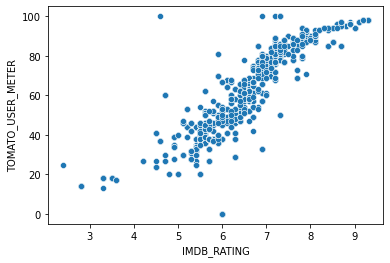

<AxesSubplot:xlabel='IMDB_RATING', ylabel='TOMATO_USER_METER'>

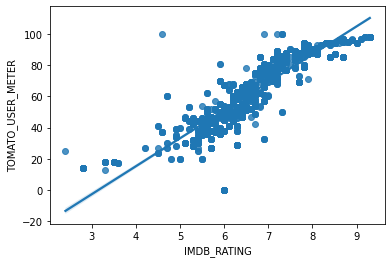

In [91]:
no_miss_user_meter = no_miss_TOMATO_ROTTEN.loc[~no_miss_TOMATO_ROTTEN['TOMATO_USER_METER'].isnull()]
miss_user_meter = no_miss_TOMATO_ROTTEN.loc[no_miss_TOMATO_ROTTEN['TOMATO_USER_METER'].isnull()]

sns.scatterplot('IMDB_RATING','TOMATO_USER_METER', data = no_miss_TOMATO_ROTTEN)
plt.show()
sns.regplot('IMDB_RATING','TOMATO_USER_METER',data = no_miss_TOMATO_ROTTEN)

In [92]:
df_user_meter_train = no_miss_user_meter[['ASSET_ID','IMDB_RATING','TOMATO_USER_METER']]
df_user_meter_pred = miss_user_meter[['ASSET_ID','IMDB_RATING','TOMATO_USER_METER']]
df_user_meter_train

,ASSET_ID,IMDB_RATING,TOMATO_USER_METER
0,185444,5.4,38.0
1,185444,5.4,38.0
2,185444,5.4,38.0
3,185444,5.4,38.0
4,185444,5.4,38.0
...,...,...,...
2442,195433,5.3,32.0
2443,195433,5.3,32.0
2444,195433,5.3,32.0
2445,195433,5.3,32.0


In [93]:
#Specifying the x and y values
x=df_user_meter_train.iloc[:,1].values.reshape(-1,1)
y=df_user_meter_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")


The value of R2 (coeff of determination) is:  0.7909480500374108
intercept or b1: -56.27891675690854
slope or b2: [17.89452549]


In [94]:
#predicting the missing values
x_new=df_user_meter_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

array([34.98316327, 34.98316327, 34.98316327, 34.98316327, 34.98316327,
       34.98316327, 34.98316327, 34.98316327, 77.93002445, 77.93002445,
       77.93002445, 83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 ,
       83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 ,
       83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 ,
       83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 ,
       83.2983821 , 83.2983821 , 58.24604641, 58.24604641, 58.24604641,
       58.24604641, 58.24604641, 58.24604641, 58.24604641, 58.24604641,
       58.24604641, 58.24604641, 58.24604641, 58.24604641, 58.24604641,
       58.24604641, 58.24604641, 58.24604641, 58.24604641, 58.24604641,
       83.2983821 , 83.2983821 , 83.2983821 , 83.2983821 , 49.29878366,
       49.29878366, 29.61480562, 29.61480562, 20.66754287, 20.66754287,
       20.66754287, 20.66754287, 20.66754287, 20.66754287, 20.66754287,
       20.66754287, 20.66754287, 20.66754287, 20.66754287, 20.66

In [95]:
miss_user_meter['TOMATO_USER_METER']=y_pred.round()
miss_user_meter

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
96,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,35.0,3.5,55.0,NaN,0,0,1,150,Daytime,110088,347568.0,12,12,Thursday,Thursday,6,2014,15:00:00,17:30:00
97,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,35.0,3.5,55.0,NaN,0,0,1,150,Daytime,113945,459050.0,13,13,Sunday,Sunday,7,2014,12:00:00,14:30:00
98,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,35.0,3.5,55.0,NaN,0,1,0,149,Late Night,75306,625027.0,24,24,Thursday,Thursday,7,2014,00:01:00,02:30:00
99,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,35.0,3.5,55.0,NaN,0,1,0,149,Late Fringe,238149,405794.0,11,12,Wednesday,Thursday,6,2014,22:31:00,01:00:00
100,185356,2006.0,PG,"Action, Adventure, Family",5.1,38.0,101610,0,0,5,1,27.0,4.1,61.0,22.0,26.0,35.0,3.5,55.0,NaN,0,0,1,150,Early Fringe,244042,603226.0,10,10,Saturday,Saturday,5,2014,18:30:00,21:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [96]:
no_miss_TOMATO_USER_METER  = pd.concat([no_miss_user_meter,miss_user_meter])
no_miss_TOMATO_USER_METER

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,NaN,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [97]:
no_miss_TOMATO_USER_METER.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS           0
TOMATO_FRESH             0
TOMATO_ROTTEN            0
TOMATO_USER_METER        0
TOMATO_USER_RATINGS     50
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

### Dealing with the missing TOMATO_USER_RATINGS using Linear regression model

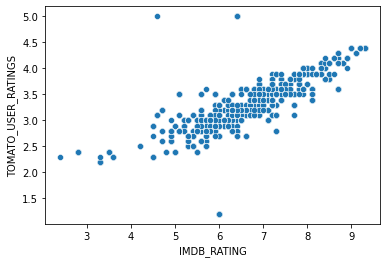

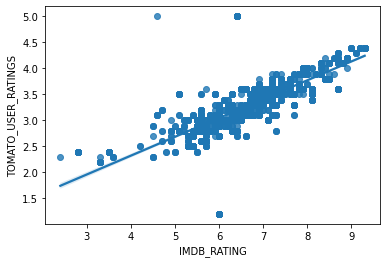

,ASSET_ID,IMDB_RATING,TOMATO_USER_RATINGS
0,185444,5.4,2.8
1,185444,5.4,2.8
2,185444,5.4,2.8
3,185444,5.4,2.8
4,185444,5.4,2.8
...,...,...,...
1786,181766,6.4,5.0
1787,181766,6.4,5.0
1788,181766,6.4,5.0
1789,181766,6.4,5.0


In [98]:
no_miss_user_rating = no_miss_TOMATO_USER_METER.loc[~no_miss_TOMATO_USER_METER['TOMATO_USER_RATINGS'].isnull()]
miss_user_rating = no_miss_TOMATO_USER_METER.loc[no_miss_TOMATO_USER_METER['TOMATO_USER_RATINGS'].isnull()]

sns.scatterplot('IMDB_RATING','TOMATO_USER_RATINGS', data = no_miss_TOMATO_USER_METER)
plt.show()
sns.regplot('IMDB_RATING','TOMATO_USER_RATINGS',data = no_miss_TOMATO_USER_METER)
plt.show()

df_user_rating_train = no_miss_user_rating[['ASSET_ID','IMDB_RATING','TOMATO_USER_RATINGS']]
df_user_rating_pred = miss_user_rating[['ASSET_ID','IMDB_RATING','TOMATO_USER_RATINGS']]
df_user_rating_train

In [99]:
#Specifying the x and y values
x=df_user_rating_train.iloc[:,1].values.reshape(-1,1)
y=df_user_rating_train.iloc[:,-1].values

#model creation
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x,y)

r_sqr = regressor.score(x,y)
print("The value of R2 (coeff of determination) is: ",r_sqr)

#b0 and b1 calculation
print(f"intercept or b1: {regressor.intercept_}")

print(f"slope or b2: {regressor.coef_}")

#predicting the missing values
x_new=df_user_rating_pred.iloc[:,1].values.reshape(-1,1) 
y_pred = regressor.predict(x_new)
y_pred

The value of R2 (coeff of determination) is:  0.6156767229336846
intercept or b1: 0.8731444168603311
slope or b2: [0.36224008]


array([3.69861705, 3.69861705, 3.69861705, 3.69861705, 3.69861705,
       3.69861705, 3.69861705, 3.69861705, 3.69861705, 3.69861705,
       3.69861705, 3.69861705, 3.69861705, 3.69861705, 3.69861705,
       3.69861705, 3.69861705, 3.69861705, 3.69861705, 3.69861705,
       3.69861705, 3.69861705, 3.69861705, 3.69861705, 3.69861705,
       3.01036089, 3.01036089, 2.6118968 , 2.6118968 , 2.43077676,
       2.43077676, 2.43077676, 2.43077676, 2.43077676, 2.43077676,
       2.43077676, 2.43077676, 2.43077676, 2.43077676, 2.43077676,
       2.43077676, 2.43077676, 2.43077676, 2.43077676, 2.43077676,
       3.55372101, 3.55372101, 3.55372101, 3.55372101, 3.55372101])

In [100]:
miss_user_rating['TOMATO_USER_RATINGS']=y_pred.round(1)
miss_user_rating

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
962,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,1,0,150,Daytime,97142,313892.0,6,6,Thursday,Thursday,11,2014,15:00:00,17:30:00
963,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,150,Daytime,68823,188851.0,18,18,Wednesday,Wednesday,6,2014,13:00:00,15:30:00
964,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,1,0,150,Early Fringe,198155,339264.0,17,17,Tuesday,Tuesday,6,2014,19:00:00,21:30:00
965,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,150,Breakfast,40389,138674.0,7,7,Friday,Friday,11,2014,09:30:00,12:00:00
966,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,1,0,148,Daytime,123356,394548.0,22,22,Sunday,Sunday,6,2014,12:02:00,14:30:00
967,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,149,Late Night,39367,293379.0,10,10,Wednesday,Wednesday,12,2014,01:01:00,03:30:00
968,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,150,Daytime,112822,297755.0,10,10,Wednesday,Wednesday,12,2014,15:00:00,17:30:00
969,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,1,0,150,Daytime,42606,218683.0,19,19,Friday,Friday,12,2014,12:30:00,15:00:00
970,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,150,Late Night,25424,155560.0,18,18,Wednesday,Wednesday,6,2014,01:30:00,04:00:00
971,171986,1984.0,PG,"Comedy, Fantasy",7.8,67.0,230092,2,0,6,4,79.0,7.2,126.0,82.0,52.0,83.0,3.7,NaN,NaN,0,0,1,150,Breakfast,58374,160910.0,23,23,Monday,Monday,6,2014,09:30:00,12:00:00


In [101]:
no_miss_TOMATO_USER_RATINGS  = pd.concat([no_miss_user_rating,miss_user_rating])
no_miss_TOMATO_USER_RATINGS

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_USER_REVIEWS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,376512.0,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [102]:
no_miss_TOMATO_USER_RATINGS.isnull().sum()

ASSET_ID                 0
RELEASE_YEAR             0
MPAA_RATING             30
GENRE                    0
IMDB_RATING              0
IMDB_RANKING             0
IMDB_VOTES               0
Oscar-Nomination         0
Oscar-Wins               0
Other - Nominations      0
Other - Wins             0
TOMATO_METER             0
TOMATO_RATING            0
TOMATO_REVIEWS           0
TOMATO_FRESH             0
TOMATO_ROTTEN            0
TOMATO_USER_METER        0
TOMATO_USER_RATINGS      0
TOMATO_USER_REVIEWS     50
TOMATO_IMAGE           159
PREMIER_AIRING           0
EXHIBITION_AIRING        0
FREE_AIRING              0
SCHEDULED_RUNTIME        0
DAY_PART                 0
AIRING_REVENUE           0
C3_RATING                0
AIRING_START_DATE        0
AIRING_END_DATE          0
AIRING_START_DAY         0
AIRING_END_DAY           0
AIRING_MONTH             0
AIRING_YEAR              0
AIRING_START_TIME        0
AIRING_END_TIME          0
dtype: int64

In [103]:
#dropping out the TOMATO_USER_REVIEWS feature
final_data_1 =no_miss_TOMATO_USER_RATINGS.drop('TOMATO_USER_REVIEWS',axis=1)

In [104]:
final_data_1

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [105]:
final_data_1.TOMATO_IMAGE.value_counts()

rotten       1132
certified     702
fresh         479
Name: TOMATO_IMAGE, dtype: int64

<AxesSubplot:xlabel='TOMATO_IMAGE', ylabel='TOMATO_RATING'>

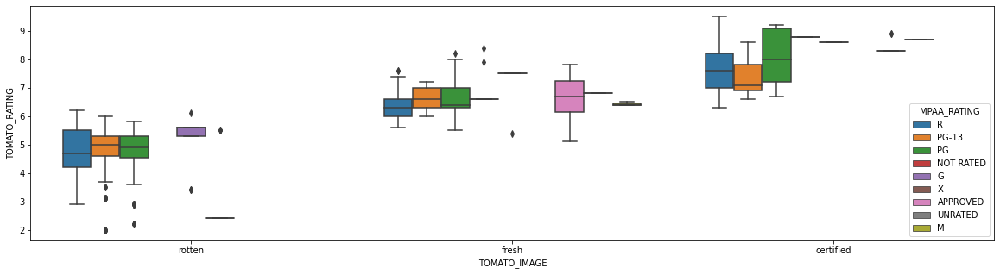

In [106]:
x=final_data_1.TOMATO_IMAGE
y=final_data_1.TOMATO_RATING
plt.figure(figsize=(20,5))
sns.boxplot(x,y,data = final_data_1,hue = 'MPAA_RATING')

<AxesSubplot:xlabel='MPAA_RATING', ylabel='IMDB_RATING'>

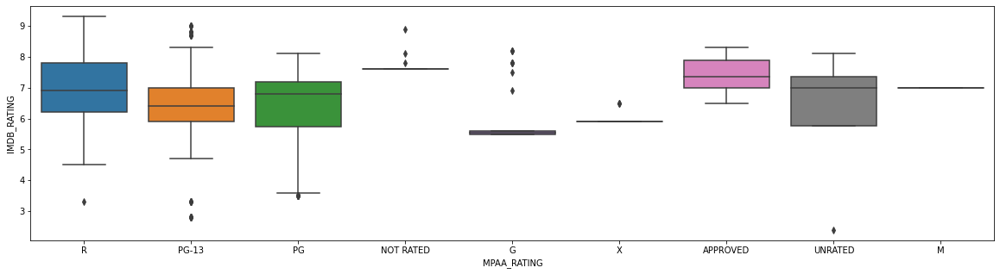

In [107]:
x=final_data_1.MPAA_RATING
y=final_data_1.IMDB_RATING
plt.figure(figsize=(20,5))
sns.boxplot(x,y,data = final_data_1)

In [108]:
final_data_1.corr()

,ASSET_ID,RELEASE_YEAR,IMDB_RATING,IMDB_RANKING,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_MONTH,AIRING_YEAR
ASSET_ID,1.000000,0.269326,-0.091168,-0.116531,-0.054520,0.042141,0.065770,0.074443,-0.128045,-0.108149,0.190883,0.140894,0.140437,-0.136051,-0.062137,0.161242,0.006147,-0.006147,-0.023554,0.042880,0.000234,0.032377,0.026205,-0.045361,0.066262
RELEASE_YEAR,0.269326,1.000000,-0.195158,-0.190838,-0.149498,-0.131280,0.192343,0.083959,-0.335086,-0.277849,0.657143,0.382090,0.614813,-0.267863,-0.145901,0.043581,-0.040659,0.040659,0.006510,0.052390,-0.145888,-0.052742,-0.053584,-0.110448,0.139557
IMDB_RATING,-0.091168,-0.195158,1.000000,0.837247,0.568839,0.428985,0.469273,0.476926,0.800605,0.858193,0.155621,0.510774,-0.352497,0.894286,0.791936,-0.064914,-0.073587,0.073587,0.516581,0.323850,0.181084,0.101698,0.096861,-0.098051,-0.068423
IMDB_RANKING,-0.116531,-0.190838,0.837247,1.000000,0.466057,0.393070,0.459500,0.482434,0.855425,0.895232,0.141379,0.552742,-0.430342,0.786210,0.678869,-0.065916,-0.057675,0.057675,0.416606,0.261869,0.133312,0.090233,0.087501,-0.076872,-0.070320
Oscar-Nomination,-0.054520,-0.149498,0.568839,0.466057,1.000000,0.727778,0.526659,0.579501,0.435064,0.508912,0.068993,0.305064,-0.256523,0.452856,0.460830,-0.068143,-0.080848,0.080848,0.566484,0.308076,0.153436,0.090275,0.086917,-0.133316,-0.021123
Oscar-Wins,0.042141,-0.131280,0.428985,0.393070,0.727778,1.000000,0.598301,0.701421,0.345867,0.426124,0.121199,0.325684,-0.197670,0.321267,0.276825,-0.057322,-0.066262,0.066262,0.521216,0.293771,0.129579,0.051321,0.044565,-0.105592,0.021339
Other - Nominations,0.065770,0.192343,0.469273,0.459500,0.526659,0.598301,1.000000,0.878493,0.359697,0.430044,0.444337,0.662670,-0.074011,0.365167,0.372767,-0.031382,-0.074330,0.074330,0.509058,0.349578,0.110237,0.028111,0.024275,-0.102703,-0.008367
Other - Wins,0.074443,0.083959,0.476926,0.482434,0.579501,0.701421,0.878493,1.000000,0.377415,0.462204,0.317361,0.574469,-0.177010,0.363718,0.368671,-0.043182,-0.046154,0.046154,0.497053,0.318306,0.115794,0.037245,0.030253,-0.123204,-0.037451
TOMATO_METER,-0.128045,-0.335086,0.800605,0.855425,0.435064,0.345867,0.359697,0.377415,1.000000,0.961029,0.002700,0.485678,-0.580494,0.760215,0.584603,-0.065968,-0.048327,0.048327,0.351378,0.224620,0.126316,0.084377,0.080698,-0.057229,-0.087065
TOMATO_RATING,-0.108149,-0.277849,0.858193,0.895232,0.508912,0.426124,0.430044,0.462204,0.961029,1.000000,0.090121,0.528807,-0.486845,0.781412,0.636391,-0.062792,-0.050883,0.050883,0.430826,0.257984,0.125583,0.086241,0.082398,-0.081803,-0.075340


<AxesSubplot:xlabel='C3_RATING', ylabel='AIRING_REVENUE'>

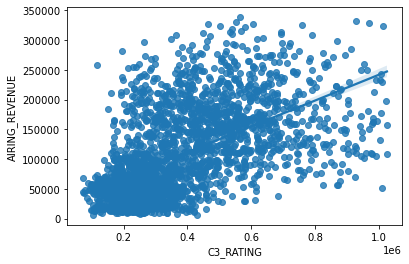

In [109]:
sns.regplot('C3_RATING','AIRING_REVENUE',data = final_data_1)

In [110]:
final_data_1

,ASSET_ID,RELEASE_YEAR,MPAA_RATING,GENRE,IMDB_RATING,IMDB_RANKING,IMDB_VOTES,Oscar-Nomination,Oscar-Wins,Other - Nominations,Other - Wins,TOMATO_METER,TOMATO_RATING,TOMATO_REVIEWS,TOMATO_FRESH,TOMATO_ROTTEN,TOMATO_USER_METER,TOMATO_USER_RATINGS,TOMATO_IMAGE,PREMIER_AIRING,EXHIBITION_AIRING,FREE_AIRING,SCHEDULED_RUNTIME,DAY_PART,AIRING_REVENUE,C3_RATING,AIRING_START_DATE,AIRING_END_DATE,AIRING_START_DAY,AIRING_END_DAY,AIRING_MONTH,AIRING_YEAR,AIRING_START_TIME,AIRING_END_TIME
0,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Late Night,11579,194900.0,19,19,Wednesday,Wednesday,11,2014,03:30:00,05:30:00
1,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Daytime,78980,455576.0,27,27,Monday,Monday,10,2014,15:00:00,17:00:00
2,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,1,0,120,Late Fringe,171319,604536.0,23,24,Thursday,Friday,10,2014,22:00:00,00:00:00
3,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,0,1,120,Daytime,40895,340602.0,24,24,Friday,Friday,10,2014,11:30:00,13:30:00
4,185444,2002.0,R,"Horror, Mystery",5.4,28.0,"70,668",0,0,1,1,14.0,3.8,124.0,17.0,107.0,38.0,2.8,rotten,0,0,1,120,Daytime,47921,346769.0,19,19,Wednesday,Wednesday,11,2014,13:00:00,15:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2461,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,1,0,150,Daytime,61599,169487.0,7,7,Friday,Friday,3,2014,13:00:00,15:30:00
2462,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,0,1,150,Daytime,52092,149038.0,20,20,Thursday,Thursday,2,2014,11:30:00,14:00:00
2463,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,1,1,0,150,Late Night,19811,231558.0,20,20,Thursday,Thursday,2,2014,02:00:00,04:30:00
2464,185508,2007.0,NaN,Documentary,7.4,64.0,57,0,0,0,0,71.0,6.8,116.0,73.0,48.0,76.0,3.6,NaN,0,1,0,150,Breakfast,58703,140062.0,15,15,Thursday,Thursday,5,2014,09:00:00,11:30:00


In [111]:
final_data_1.DAY_PART.unique()

array(['Late Night', 'Daytime', 'Late Fringe', 'Early Fringe',
       'Breakfast', 'Early Morning'], dtype=object)

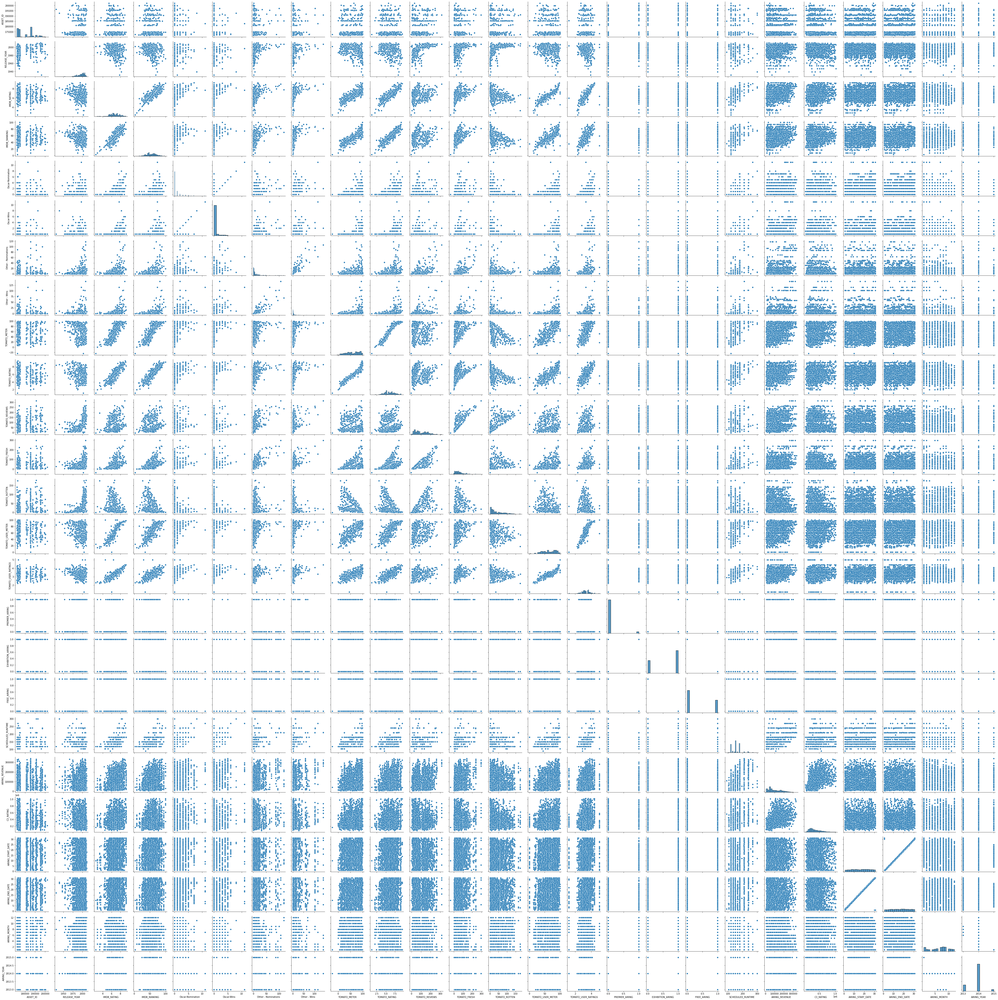

In [112]:
sns.pairplot(final_data_1)

### 1. Create a model with the data to estimate revenue that an asset will generate if telecasted at a given time point (day-part and date).

In [113]:
final_data_02 = final_data_1[['ASSET_ID','DAY_PART','AIRING_START_DATE','AIRING_START_DAY','AIRING_MONTH','AIRING_YEAR','SCHEDULED_RUNTIME','C3_RATING','AIRING_REVENUE']]
final_data_02

,ASSET_ID,DAY_PART,AIRING_START_DATE,AIRING_START_DAY,AIRING_MONTH,AIRING_YEAR,SCHEDULED_RUNTIME,C3_RATING,AIRING_REVENUE
0,185444,Late Night,19,Wednesday,11,2014,120,194900.0,11579
1,185444,Daytime,27,Monday,10,2014,120,455576.0,78980
2,185444,Late Fringe,23,Thursday,10,2014,120,604536.0,171319
3,185444,Daytime,24,Friday,10,2014,120,340602.0,40895
4,185444,Daytime,19,Wednesday,11,2014,120,346769.0,47921
...,...,...,...,...,...,...,...,...,...
2461,185508,Daytime,7,Friday,3,2014,150,169487.0,61599
2462,185508,Daytime,20,Thursday,2,2014,150,149038.0,52092
2463,185508,Late Night,20,Thursday,2,2014,150,231558.0,19811
2464,185508,Breakfast,15,Thursday,5,2014,150,140062.0,58703


In [114]:
final_data_02.groupby(['ASSET_ID','DAY_PART']).sum()['AIRING_REVENUE']

ASSET_ID  DAY_PART    
171646    Early Fringe    178543
171652    Daytime         190205
          Early Fringe    278768
          Late Night      244127
171685    Early Fringe    147784
                           ...  
200321    Daytime         109733
          Late Night       13856
200437    Breakfast        57346
          Late Night       32152
202224    Breakfast        44510
Name: AIRING_REVENUE, Length: 1049, dtype: int64

In [115]:
#filtering out the desired data in order to create the model.
final_data_03 = final_data_02[['ASSET_ID','AIRING_START_DAY','DAY_PART','C3_RATING','SCHEDULED_RUNTIME','AIRING_REVENUE']]
df_01 = final_data_03.groupby(['ASSET_ID','AIRING_START_DAY','DAY_PART','C3_RATING']).sum().reset_index()
df_01['ASSET_ID'] = df_01.ASSET_ID.astype(str)
df_01

,ASSET_ID,AIRING_START_DAY,DAY_PART,C3_RATING,SCHEDULED_RUNTIME,AIRING_REVENUE
0,171646,Friday,Early Fringe,456122.0,150,178543
1,171652,Monday,Daytime,209960.0,120,44330
2,171652,Monday,Daytime,225378.0,120,44120
3,171652,Monday,Early Fringe,379762.0,120,104594
4,171652,Monday,Late Night,187547.0,120,17851
...,...,...,...,...,...,...
2467,200321,Tuesday,Daytime,232279.0,120,31380
2468,200321,Wednesday,Daytime,261052.0,120,39261
2469,200437,Sunday,Late Night,611216.0,180,32152
2470,200437,Wednesday,Breakfast,332919.0,180,57346


In [116]:
df_01.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2472 entries, 0 to 2471
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ASSET_ID           2472 non-null   object 
 1   AIRING_START_DAY   2472 non-null   object 
 2   DAY_PART           2472 non-null   object 
 3   C3_RATING          2472 non-null   float64
 4   SCHEDULED_RUNTIME  2472 non-null   int64  
 5   AIRING_REVENUE     2472 non-null   int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 116.0+ KB


In [117]:
# converting the categorical data into numerical for machine learning modal
df_02 = pd.get_dummies(df_01,columns = ['AIRING_START_DAY'],prefix=['Airing'])
df_02.drop(['DAY_PART','AIRING_REVENUE'],axis=1,inplace=True)
df_02

,ASSET_ID,C3_RATING,SCHEDULED_RUNTIME,Airing_Friday,Airing_Monday,Airing_Saturday,Airing_Sunday,Airing_Thursday,Airing_Tuesday,Airing_Wednesday
0,171646,456122.0,150,1,0,0,0,0,0,0
1,171652,209960.0,120,0,1,0,0,0,0,0
2,171652,225378.0,120,0,1,0,0,0,0,0
3,171652,379762.0,120,0,1,0,0,0,0,0
4,171652,187547.0,120,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
2467,200321,232279.0,120,0,0,0,0,0,1,0
2468,200321,261052.0,120,0,0,0,0,0,0,1
2469,200437,611216.0,180,0,0,0,1,0,0,0
2470,200437,332919.0,180,0,0,0,0,0,0,1


In [118]:
# Import label encoder
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'ASSET_ID'.
df_01['ASSET_ID']= label_encoder.fit_transform(df_01['ASSET_ID'])
df_01

,ASSET_ID,AIRING_START_DAY,DAY_PART,C3_RATING,SCHEDULED_RUNTIME,AIRING_REVENUE
0,0,Friday,Early Fringe,456122.0,150,178543
1,1,Monday,Daytime,209960.0,120,44330
2,1,Monday,Daytime,225378.0,120,44120
3,1,Monday,Early Fringe,379762.0,120,104594
4,1,Monday,Late Night,187547.0,120,17851
...,...,...,...,...,...,...
2467,402,Tuesday,Daytime,232279.0,120,31380
2468,402,Wednesday,Daytime,261052.0,120,39261
2469,403,Sunday,Late Night,611216.0,180,32152
2470,403,Wednesday,Breakfast,332919.0,180,57346


In [119]:
#dummy variables for the day_part
df_03 = pd.get_dummies(df_01,columns = ['DAY_PART'],prefix=['PART'])
df_03.drop('AIRING_START_DAY',axis=1,inplace=True)
df_03

,ASSET_ID,C3_RATING,SCHEDULED_RUNTIME,AIRING_REVENUE,PART_Breakfast,PART_Daytime,PART_Early Fringe,PART_Early Morning,PART_Late Fringe,PART_Late Night
0,0,456122.0,150,178543,0,0,1,0,0,0
1,1,209960.0,120,44330,0,1,0,0,0,0
2,1,225378.0,120,44120,0,1,0,0,0,0
3,1,379762.0,120,104594,0,0,1,0,0,0
4,1,187547.0,120,17851,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...
2467,402,232279.0,120,31380,0,1,0,0,0,0
2468,402,261052.0,120,39261,0,1,0,0,0,0
2469,403,611216.0,180,32152,0,0,0,0,0,1
2470,403,332919.0,180,57346,1,0,0,0,0,0


In [120]:
model_ready=pd.concat([df_01['ASSET_ID'],df_02.iloc[:,1:],df_03.iloc[:,4:],df_03['AIRING_REVENUE']],axis =1)
model_ready

,ASSET_ID,C3_RATING,SCHEDULED_RUNTIME,Airing_Friday,Airing_Monday,Airing_Saturday,Airing_Sunday,Airing_Thursday,Airing_Tuesday,Airing_Wednesday,PART_Breakfast,PART_Daytime,PART_Early Fringe,PART_Early Morning,PART_Late Fringe,PART_Late Night,AIRING_REVENUE
0,0,456122.0,150,1,0,0,0,0,0,0,0,0,1,0,0,0,178543
1,1,209960.0,120,0,1,0,0,0,0,0,0,1,0,0,0,0,44330
2,1,225378.0,120,0,1,0,0,0,0,0,0,1,0,0,0,0,44120
3,1,379762.0,120,0,1,0,0,0,0,0,0,0,1,0,0,0,104594
4,1,187547.0,120,0,1,0,0,0,0,0,0,0,0,0,0,1,17851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2467,402,232279.0,120,0,0,0,0,0,1,0,0,1,0,0,0,0,31380
2468,402,261052.0,120,0,0,0,0,0,0,1,0,1,0,0,0,0,39261
2469,403,611216.0,180,0,0,0,1,0,0,0,0,0,0,0,0,1,32152
2470,403,332919.0,180,0,0,0,0,0,0,1,1,0,0,0,0,0,57346


In [121]:
#splitting the x and y
x = model_ready.iloc[:,:-1].values
y=model_ready.iloc[:,-1].values

In [122]:
#train the data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.33,random_state=1)


In [123]:
#importing the library and linearregression model
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(x_train,y_train)

#Predicting the test set results
y_pred = regressor.predict(x_test)
np.set_printoptions(precision=2)

#printing y_pred and y_test side by side.... where LHS = y_pred and RHS = y_test
print(np.concatenate((y_pred.reshape(len(y_pred),1),(y_test.reshape(len(y_test),1))),1))

[[177174.37 162994.  ]
 [ 73816.95  54653.  ]
 [ 64673.56  53248.  ]
 ...
 [181668.14 196093.  ]
 [ 72171.65  79808.  ]
 [ 61282.25 136011.  ]]


In [124]:
from sklearn.metrics import r2_score
r2_score(y_test,y_pred)

0.7475367833377577

```74.5%``` Model is predicted good.

In [126]:
from sklearn.metrics import mean_squared_error
import math
mse = mean_squared_error(y_test, y_pred)
rmse = math.sqrt(mse)
print('Mean square error:',mse)
print('Root mean square error:',rmse)

Mean square error: 1340575044.2660732
Root mean square error: 36613.86409908238


### 2. Will the revenue generated by an asset depend on external factors, like what time the movie was shown, or on factors internal to the asset or on both?

In [ ]:
final_data_1.corr()

In [ ]:
plt.figure(figsize=(25,12))
sns.heatmap(final_data_1.corr(),annot=True)

### Observations:-
By seeing the heatmap we can observe that the Airing Revenue depends on both the internal and external factors, but a bit more biased towards the external one:-
1. External Factors: C3 Rating (0.57), Scheduled Runtime(0.45)
2. Internal Factors (Weak) : IMDB RATING, Oscar Nomination, Other Nomination, other wins, tomato fresh (all in the range of 0.30 - 0.35)

### 3. Is there an interaction between when the movie was shown and asset characteristics, like genre?

In [ ]:
final_data_1.head(3)

In [ ]:
final_data_1['GENRE'].value_counts()

In [ ]:
plt.figure(figsize=(25,40))
x=final_data_1['GENRE']
y=final_data_1['AIRING_YEAR']
sns.boxplot(y,x)

In [ ]:
plt.figure(figsize=(25,40))
x=final_data_1['GENRE']
y=final_data_1['AIRING_MONTH']
sns.boxplot(y,x)

In [ ]:
plt.figure(figsize=(20,13))
x=final_data_1['AIRING_START_DAY']
y=final_data_1['AIRING_REVENUE']
sns.boxplot(x,y,hue='DAY_PART',data=final_data_1)

### 4. Is there a linear dependence of revenue on the factors you found?


In [ ]:
# A Linear dependency has been seen on the following factors
sns.scatterplot(final_data_1['C3_RATING'],final_data_1['AIRING_REVENUE'])

No other linear dependencies have been seen with the AIRING_REVENUE except of C3_RATING.

### 5. Is there any seasonality effect in the data? Are there any holiday effects?


In [ ]:
#HOLIDAY EFFECTS (Saturday and Sunday)
plt.figure(figsize=(20,13))
x=final_data_1['AIRING_START_DAY']
y=final_data_1['AIRING_REVENUE']
sns.boxplot(x,y,hue='DAY_PART',data=final_data_1)

### Observations:-
1. Early Fringe and the Late Fringe are most revenue generating day_part.
2. On Saturday and Sunday (that is on holidays) more revenue is generated during the Breakfast and Daytime too comparing the weekdays.

In [ ]:
final_data_1.head(3)

In [ ]:
# Revenue total during the week days.
final_data_1.groupby('AIRING_START_DAY').sum()['AIRING_REVENUE'].sort_values()

### 6. Can you test if a movie of a specific genre can generate more revenue if it’s shown during the Prime time (fringe) of a weekend against the primetime of any weekday?

In [ ]:
#checking out the data
final_data_1.head(5)

In [ ]:
#filtering out the weekends and weekdays data
weekends = final_data_1.loc[(final_data_1['AIRING_START_DAY'] == 'Sunday') | (final_data_1['AIRING_START_DAY']=='Saturday')]
weekdays = final_data_1.loc[(final_data_1['AIRING_START_DAY'] != 'Sunday') & (final_data_1['AIRING_START_DAY']!='Saturday')]
weekends

In [ ]:
#creating a desired dataframe
weekdays_01 = weekdays[['ASSET_ID','GENRE','AIRING_START_DAY','DAY_PART','AIRING_REVENUE']]
weekends_01 = weekends[['ASSET_ID','GENRE','AIRING_START_DAY','DAY_PART','AIRING_REVENUE']]
weekends_01

In [ ]:
weekdays_fringe = weekdays_01.loc[weekdays_01.DAY_PART.str.contains('Fringe')]
weekdays_fringe

In [ ]:
weekends_fringe = weekends_01.loc[weekends_01.DAY_PART.str.contains('Fringe')]
weekends_fringe

In [ ]:
days_grouped = weekdays_fringe.groupby(['ASSET_ID','GENRE','AIRING_START_DAY']).sum()['AIRING_REVENUE'].reset_index()
days_grouped

In [ ]:
ends_grouped = weekends_fringe.groupby(['ASSET_ID','GENRE','AIRING_START_DAY']).sum()['AIRING_REVENUE'].reset_index()
ends_grouped

In [ ]:
days_vs_ends = pd.merge(days_grouped,ends_grouped,on='ASSET_ID')
days_vs_ends

In [ ]:
#Asset_ID along with the GENRE where weekdays generates more revenue
days_vs_ends.loc[days_vs_ends['AIRING_REVENUE_x']>=days_vs_ends['AIRING_REVENUE_y']]

In [ ]:
# list of movies of a specific GENRE generating more revenue if it’s shown during the Prime time (fringe) of a weekend against the primetime of any weekday
final_dataset = days_vs_ends.loc[days_vs_ends['AIRING_REVENUE_x']<days_vs_ends['AIRING_REVENUE_y']]
final_dataset.rename(columns={'AIRING_START_DAY_x':'Weekdays','AIRING_REVENUE_x':'Weekdays_Revenue','AIRING_START_DAY_y':'Weekends','AIRING_REVENUE_y':'Weekends_Revenue'},inplace=True)
final_dataset.drop("GENRE_y",axis=1,inplace=True)

In [ ]:
#Movies generating more revenues during weekends Prime time
final_dataset